In [3]:
import numpy as np 
import scipy.io
import matplotlib.pyplot as plt
import os
from scipy import signal

# Traverse the directory 'EEG_Data' to find all files within it
file_names=[]
for dirname, _, filenames in os.walk('EEG_Data'):
    for filename in filenames:
        file_names.append(os.path.join(dirname, filename))

print(file_names)

['EEG_Data\\eeg_record1.mat', 'EEG_Data\\eeg_record10.mat', 'EEG_Data\\eeg_record11.mat', 'EEG_Data\\eeg_record12.mat', 'EEG_Data\\eeg_record13.mat', 'EEG_Data\\eeg_record14.mat', 'EEG_Data\\eeg_record15.mat', 'EEG_Data\\eeg_record16.mat', 'EEG_Data\\eeg_record17.mat', 'EEG_Data\\eeg_record18.mat', 'EEG_Data\\eeg_record19.mat', 'EEG_Data\\eeg_record2.mat', 'EEG_Data\\eeg_record20.mat', 'EEG_Data\\eeg_record21.mat', 'EEG_Data\\eeg_record22.mat', 'EEG_Data\\eeg_record23.mat', 'EEG_Data\\eeg_record24.mat', 'EEG_Data\\eeg_record25.mat', 'EEG_Data\\eeg_record26.mat', 'EEG_Data\\eeg_record27.mat', 'EEG_Data\\eeg_record28.mat', 'EEG_Data\\eeg_record29.mat', 'EEG_Data\\eeg_record3.mat', 'EEG_Data\\eeg_record30.mat', 'EEG_Data\\eeg_record31.mat', 'EEG_Data\\eeg_record32.mat', 'EEG_Data\\eeg_record33.mat', 'EEG_Data\\eeg_record34.mat', 'EEG_Data\\eeg_record4.mat', 'EEG_Data\\eeg_record5.mat', 'EEG_Data\\eeg_record6.mat', 'EEG_Data\\eeg_record7.mat', 'EEG_Data\\eeg_record8.mat', 'EEG_Data\\eeg_re

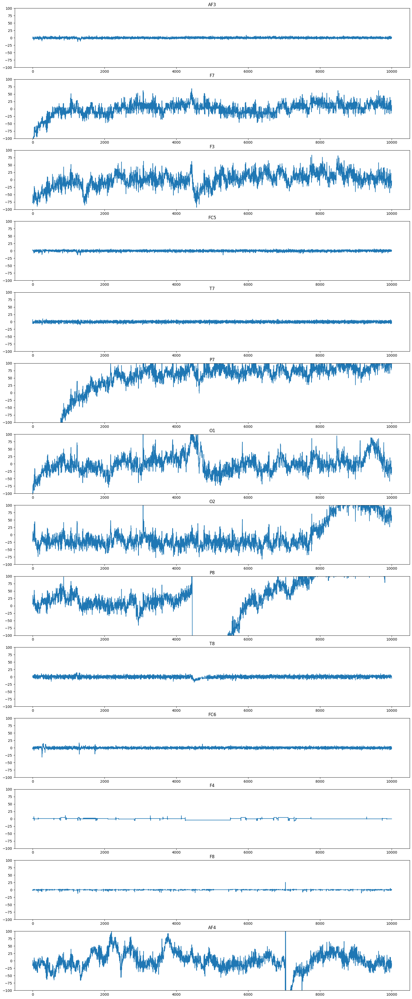

In [4]:
# There are 14 channels, the first one is in position 3
fig, ax = plt.subplots(14,1)
fig.set_figwidth(20)
fig.set_figheight(50)

mat = scipy.io.loadmat(file_names[17]) #eeg_record25.mat
data = mat['o']['data'][0,0]
FS = mat['o']['sampFreq'][0][0][0][0]
channels = ['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4']
for i in range(14):
    data_ave = data[5000:15000,i+3]-np.mean(data[5000:15000,i+3])
    ax[i].plot(data_ave)
    ax[i].set_title(channels[i])
    ax[i].set_ylim(-100,100)

According to the previous plots, F7, F3, P7, O1, O2, P8, AF4 are useful channels, so those will be the one kept for the implementation.

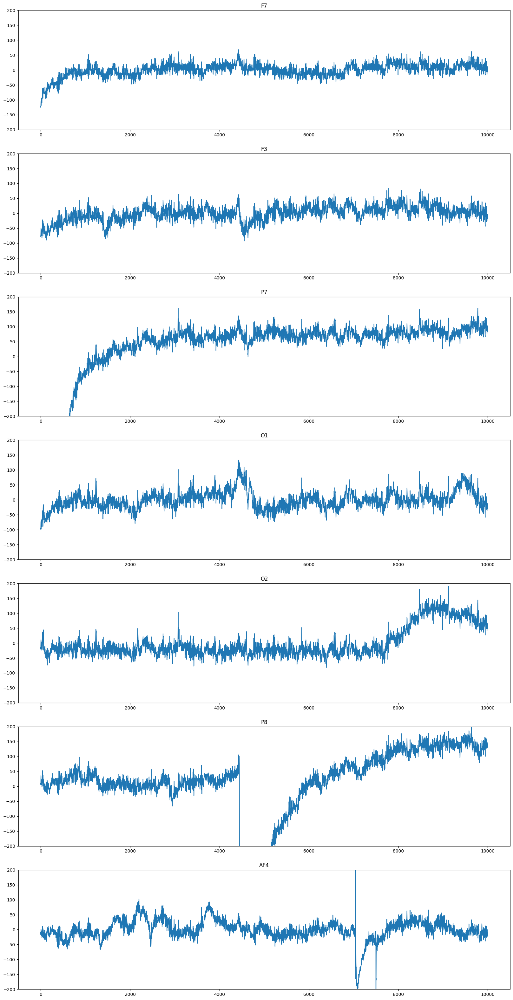

In [5]:
useful_channels=[4,5,8,9,10,11,16] #F7,F3,P7,O1,O2,P8,AF4
useful_channels_names=['F7','F3','P7','O1','O2','P8','AF4']
fig,ax = plt.subplots(7)
fig.set_size_inches(20,40)
j=0
for i in useful_channels:
    data_ave = data[5000:15000,i]-np.mean(data[5000:15000,i])
    ax[j].plot(data_ave)
    ax[j].set_ylim(-200,200)
    ax[j].set_title(channels[i-3])
    j=j+1

The states seem to be defined arbitrarily as 10 min adjacent periods.
1st 10 minutes of data(t=0 min to t=10 min) is for "focussed" state
2nd 10 minutes of data(t=10 min to t=20 min) is for "unfocussed" state
Remaining data(t=20 min to onwards) is for "Drowsed" state

In [6]:
# Samples per state = 128 samples/sec x 60 sec/min x 10 min
marker=128*60*10

useful_file_index = [3,4,5,6,7,10,11,12,13,14,17,18,19,20,21,24,25,26,27,31,32,33,34]

# Number of usefull chanels
chan_num=7

trail_names=[]

# The processed data will be stored here
data_focus={}
data_unfocus={}
data_drowsy={}

# These will keep the raw data
focus={}
unfocus={}
drowsy={}

i=1
# Iterates over the list of filenames
for index,filename in enumerate(filenames):
    # Checks if the file index is in the list of useful file indices
    if int(filename.split('d')[1].split('.')[0]) in useful_file_index:
        # Loads the MATLAB file and extracts the trial name
        mat = scipy.io.loadmat(file_names[index])
        trail_names.append(filename.split('.')[0])

        # Extracts and stores data segments for focused, unfocused, and drowsy states from the useful channels
        data_focus[trail_names[-1]]=mat['o']['data'][0,0][0:marker,useful_channels].copy()
        data_unfocus[trail_names[-1]]=mat['o']['data'][0,0][marker:2*marker,useful_channels].copy()
        data_drowsy[trail_names[-1]]=mat['o']['data'][0,0][2*marker:3*marker,useful_channels].copy()
        
        focus[trail_names[-1]]=mat['o']['data'][0,0][0:marker,useful_channels].copy()
        unfocus[trail_names[-1]]=mat['o']['data'][0,0][marker:2*marker,useful_channels].copy()
        drowsy[trail_names[-1]]=mat['o']['data'][0,0][2*marker:3*marker,useful_channels].copy()

data_focus['eeg_record3']

array([[3804.1025641 , 5210.76923077, 4490.76923077, ..., 3511.79487179,
        4321.02564103, 4024.1025641 ],
       [3796.41025641, 5205.64102564, 4489.23076923, ..., 3505.12820513,
        4311.79487179, 4017.94871795],
       [3798.97435897, 5207.17948718, 4489.23076923, ..., 3511.79487179,
        4313.84615385, 4018.97435897],
       ...,
       [3751.79487179, 5245.12820513, 4540.51282051, ..., 3495.38461538,
        4321.02564103, 4151.28205128],
       [3738.46153846, 5231.28205128, 4525.64102564, ..., 3487.69230769,
        4304.1025641 , 4134.87179487],
       [3723.58974359, 5217.94871795, 4519.48717949, ..., 3481.53846154,
        4291.79487179, 4125.64102564]], shape=(76800, 7))

In [7]:
data_focus.keys()

dict_keys(['eeg_record10', 'eeg_record11', 'eeg_record12', 'eeg_record13', 'eeg_record14', 'eeg_record17', 'eeg_record18', 'eeg_record19', 'eeg_record20', 'eeg_record21', 'eeg_record24', 'eeg_record25', 'eeg_record26', 'eeg_record27', 'eeg_record3', 'eeg_record31', 'eeg_record32', 'eeg_record33', 'eeg_record34', 'eeg_record4', 'eeg_record5', 'eeg_record6', 'eeg_record7'])

Apply a highpass filter of 0.16HZ to EEG data to remove low-frequency noise, such as movements.

In [12]:
def butter_highpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = signal.butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

def butter_highpass_filter(data, cutoff, fs, order=5):
    b, a = butter_highpass(cutoff, fs, order=order)
    x = signal.filtfilt(b, a, data)
    y = signal.filtfilt(b, a, x)
    return y

# High Pass 0.16HZ
row, col = data_focus['eeg_record3'].shape
for name in trail_names:
    for i in range(col):
        data_focus[name][:,i]=butter_highpass_filter(data_focus[name][:,i], 0.16, 128, 5)
        data_unfocus[name][:,i]=butter_highpass_filter(data_unfocus[name][:,i], 0.16, 128, 5)
        data_drowsy[name][:,i]=butter_highpass_filter(data_drowsy[name][:,i], 0.16, 128, 5)

Visualize brain activity across different attention levels with topographic heatmaps

Focus Topographic heatmap:


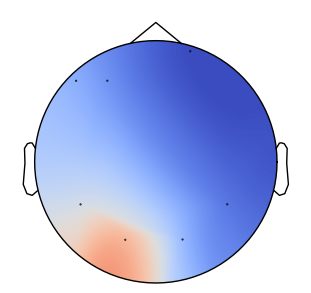

Unfocus Topographic heatmap:


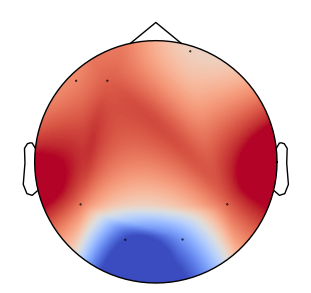

Drowsy Topographic heatmap:


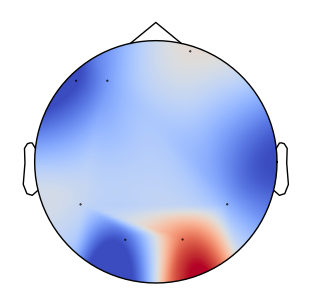

In [35]:
import mne
from matplotlib import cm

# Define channel names and locations
channels = ['F7', 'F3', 'P7', 'O1', 'O2', 'P8', 'AF4']
montage = mne.channels.make_standard_montage('standard_1020')
info = mne.create_info(ch_names=channels, sfreq=128, ch_types='eeg')
info.set_montage(montage)

# Function to compute and plot topomap
def plot_attention_topomap(data_dict):
    avg_voltage = np.mean(np.hstack([data_dict[name] for name in data_dict]), axis=0)
    avg_voltage = avg_voltage[:len(channels)]
    evoked = mne.EvokedArray(avg_voltage[:, np.newaxis], info)
    mne.viz.plot_topomap(evoked.data[:, 0], evoked.info, contours=0, cmap=cm.coolwarm, size=3, show=True)

# Plot topomaps for different attention levels
print("Focus Topographic heatmap:")
plot_attention_topomap(data_focus)
print("Unfocus Topographic heatmap:")
plot_attention_topomap(data_unfocus)
print("Drowsy Topographic heatmap:")
plot_attention_topomap(data_drowsy)


Feature extraction by dividing frequency values ranging from 0.5 to 18 Hz in 0.5 Hz increments. This will create 252 features for the posterior analysis.


In [9]:
feature_names = []
# Array of frequency values ranging from 0.5 to 18 Hz in 0.5 Hz increments
freq_range=np.arange(0.5,18.5,0.5)
symb='_'

for index,channel in enumerate(useful_channels_names):
    for freq in freq_range:
        feature_names.append(channel+symb+str(freq))
feature_names

['F7_0.5',
 'F7_1.0',
 'F7_1.5',
 'F7_2.0',
 'F7_2.5',
 'F7_3.0',
 'F7_3.5',
 'F7_4.0',
 'F7_4.5',
 'F7_5.0',
 'F7_5.5',
 'F7_6.0',
 'F7_6.5',
 'F7_7.0',
 'F7_7.5',
 'F7_8.0',
 'F7_8.5',
 'F7_9.0',
 'F7_9.5',
 'F7_10.0',
 'F7_10.5',
 'F7_11.0',
 'F7_11.5',
 'F7_12.0',
 'F7_12.5',
 'F7_13.0',
 'F7_13.5',
 'F7_14.0',
 'F7_14.5',
 'F7_15.0',
 'F7_15.5',
 'F7_16.0',
 'F7_16.5',
 'F7_17.0',
 'F7_17.5',
 'F7_18.0',
 'F3_0.5',
 'F3_1.0',
 'F3_1.5',
 'F3_2.0',
 'F3_2.5',
 'F3_3.0',
 'F3_3.5',
 'F3_4.0',
 'F3_4.5',
 'F3_5.0',
 'F3_5.5',
 'F3_6.0',
 'F3_6.5',
 'F3_7.0',
 'F3_7.5',
 'F3_8.0',
 'F3_8.5',
 'F3_9.0',
 'F3_9.5',
 'F3_10.0',
 'F3_10.5',
 'F3_11.0',
 'F3_11.5',
 'F3_12.0',
 'F3_12.5',
 'F3_13.0',
 'F3_13.5',
 'F3_14.0',
 'F3_14.5',
 'F3_15.0',
 'F3_15.5',
 'F3_16.0',
 'F3_16.5',
 'F3_17.0',
 'F3_17.5',
 'F3_18.0',
 'P7_0.5',
 'P7_1.0',
 'P7_1.5',
 'P7_2.0',
 'P7_2.5',
 'P7_3.0',
 'P7_3.5',
 'P7_4.0',
 'P7_4.5',
 'P7_5.0',
 'P7_5.5',
 'P7_6.0',
 'P7_6.5',
 'P7_7.0',
 'P7_7.5',
 'P7_8.0'

Validate the high pass filter

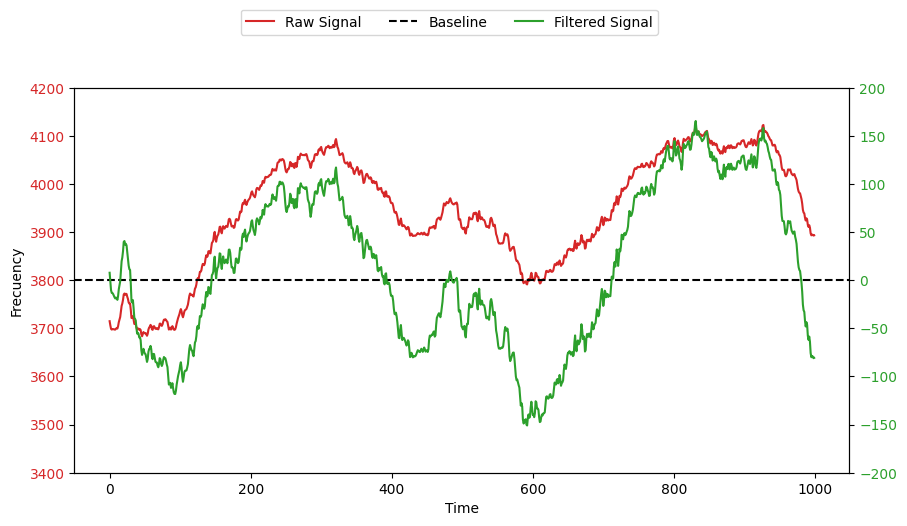

In [36]:
fig,ax = plt.subplots(1)
fig.set_size_inches(10,5)

#Plot raw data in red
color = 'tab:red'
ax.set_xlabel('Time')
ax.set_ylabel('Frecuency')
ax.plot(unfocus['eeg_record3'][0:1000,0], color = color,label='Raw Signal')
ax.tick_params(axis ='y', labelcolor = color)
ax.set_ylim(3400,4200)

#Plot filtered data in green
ax0 = ax.twinx()
color = 'tab:green'
ax0.plot(data_unfocus['eeg_record3'][0:1000,0],color=color,label='Filtered Signal')
ax0.tick_params(axis ='y', labelcolor = color)
ax0.set_ylim(-200,200)

# Plot the baseline
baseline_value = 3800
ax.axhline(y=baseline_value, color='black', linestyle='--', label='Baseline')

fig.legend(loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=3)
plt.show()

Short-Time Fourier Transform (STFT):

STFT applies a  Blackman window function to segments of the signal (1s), then performs the Fourier transform on each segment. The result of STFT is a matrix of DFT (Discrete Fourier Transform) amplitudes, showing how the frequency content of the signal evolves over time.

In [11]:
# Amplitudes X STFT (t,ω) at 1s intervals within each input EEG channel
t_win = np.arange(0,128)
M = 128
window_blackman=0.42-0.5*np.cos((2*np.pi*t_win)/(M-1))+0.08*np.cos((4*np.pi*t_win)/(M-1))

#Store the power spectral density (PSD) estimates obtained from the STFT for each trial and each EEG channel
power_focus = {}
for name in trail_names:
    power_focus[name]=np.zeros([col,513,601])
    
power_unfocus = {}
for name in trail_names:
    power_unfocus[name]=np.zeros([col,513,601])
    
power_drowsy = {}
for name in trail_names:
    power_drowsy[name]=np.zeros([col,513,601])

#the output of the stft is 513*601, 1 second data will produce 1 column of data,there are 601
for name in trail_names:
    #col = 7
    for i in range(col):
        f, t,y1=scipy.signal.stft(data_focus[name][:,i],fs=128, window=window_blackman, nperseg=128, 
                      noverlap=0, nfft=1024, detrend=False,return_onesided=True, boundary='zeros',
                      padded=True)
        f, t,y2=scipy.signal.stft(data_unfocus[name][:,i],fs=128, window=window_blackman, nperseg=128, 
                      noverlap=0, nfft=1024, detrend=False,return_onesided=True, boundary='zeros',
                      padded=True)
        f, t,y3=scipy.signal.stft(data_drowsy[name][:,i],fs=128, window=window_blackman, nperseg=128, 
                      noverlap=0, nfft=1024, detrend=False,return_onesided=True, boundary='zeros',
                      padded=True)
        # PSD estimates
        power_focus[name][i,:,:]=(np.abs(y1))**2
        power_unfocus[name][i,:,:]=(np.abs(y2))**2
        power_drowsy[name][i,:,:]=(np.abs(y3))**2
        
print(power_focus['eeg_record3'][0,:,:])

[[1.39349613e+03 1.00111530e+03 1.00122401e+04 ... 1.76895559e+02
  6.14390962e+02 3.18781338e+01]
 [1.38563558e+03 1.13765840e+03 9.84308804e+03 ... 1.73691882e+02
  6.05231971e+02 3.19566584e+01]
 [1.36231121e+03 1.53022120e+03 9.35128424e+03 ... 1.64389051e+02
  5.78552687e+02 3.21865814e+01]
 ...
 [1.52670534e-01 7.40087229e+00 1.93032096e-04 ... 3.42225399e-04
  1.91211100e-04 1.19623531e-02]
 [1.52114561e-01 7.39912208e+00 1.92342148e-04 ... 3.29425360e-04
  1.55540177e-04 1.20020818e-02]
 [1.51927069e-01 7.39853221e+00 1.92061361e-04 ... 3.25076206e-04
  1.43484022e-04 1.20156137e-02]]


Spectrograms to show how the power of the EEG signal is distributed across different frequencies over time for each channel

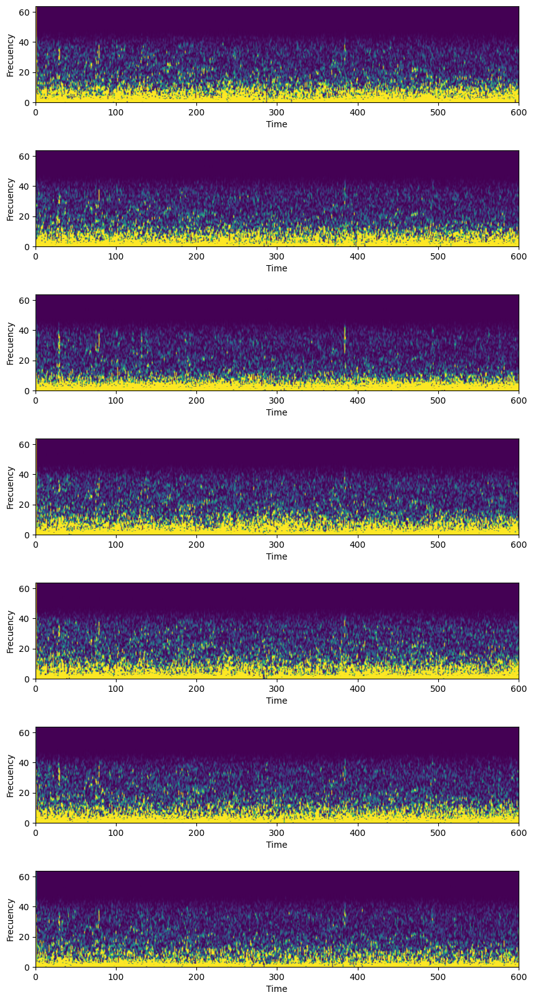

In [12]:
# Validate the power value for the focus state
fig,ax = plt.subplots(col,1)
fig.set_size_inches(10,20)
for i in range(col):
    ax[i].pcolormesh(t, f, power_focus['eeg_record3'][i,:,:],vmin=0, vmax=2*np.sqrt(2), shading='gouraud')
    ax[i].set_xlabel("Time")
    ax[i].set_ylabel("Frecuency")

plt.subplots_adjust(hspace=0.5)
plt.show()

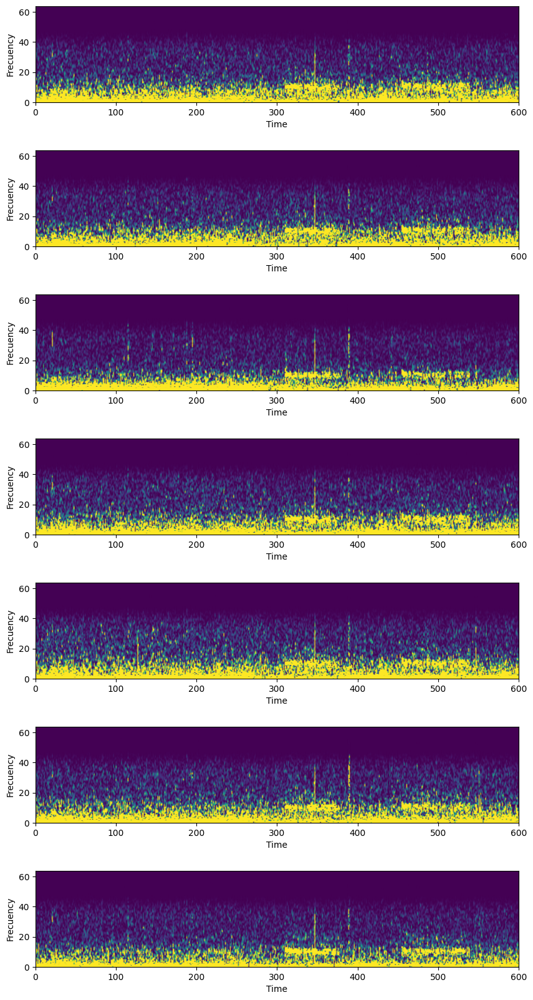

In [13]:
# Validate the power value for the unfocus state
fig,ax = plt.subplots(col,1)
fig.set_size_inches(10,20)
for i in range(col):
    ax[i].pcolormesh(t, f, power_unfocus['eeg_record3'][i,:,:],vmin=0, vmax=2*np.sqrt(2), shading='gouraud')
    ax[i].set_xlabel("Time")
    ax[i].set_ylabel("Frecuency")

plt.subplots_adjust(hspace=0.5)
plt.show()

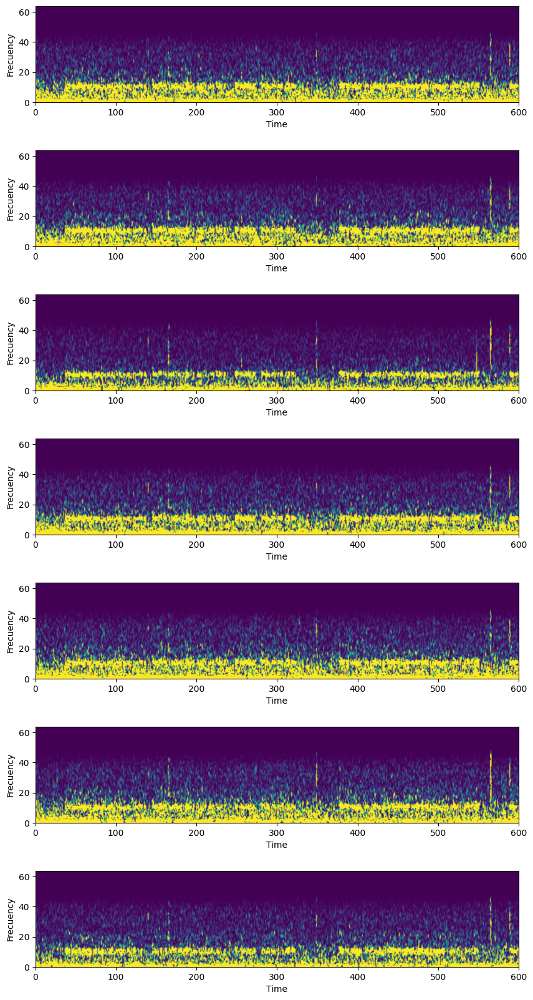

In [14]:
# Validate the power value for drowsy state
fig,ax = plt.subplots(col,1)
fig.set_size_inches(10,20)
for i in range(col):
    ax[i].pcolormesh(t, f, power_drowsy['eeg_record3'][i,:,:],vmin=0, vmax=2*np.sqrt(2), shading='gouraud')
    ax[i].set_xlabel("Time")
    ax[i].set_ylabel("Frecuency")

plt.subplots_adjust(hspace=0.5)
plt.show()

Combine the power spectral density (PSD) values into bins of 0.5 Hz width while keeping the frequency range from 0 to 18 Hz.

- 7 represents the number of EEG channels.
- 36 represents the number of bins (18 Hz divided by 0.5 Hz).
- 601 represents the number of time steps 

By combining adjacent frequency bins into larger bins, the dimensionality of the data is reduced while preserving essential frequency information.

In [15]:
num=[]

power_focus_bin = {}
for name in trail_names:
    power_focus_bin[name]=np.zeros([7,36,601])
    
power_unfocus_bin = {}
for name in trail_names:
    power_unfocus_bin[name]=np.zeros([7,36,601])
    
power_drowsy_bin = {}
for name in trail_names:
    power_drowsy_bin[name]=np.zeros([7,36,601])

for name in trail_names:
    for chn in range(col):
        j=0
        for i in range(1,144,4):
            power_focus_bin[name][chn,j,:]=np.average(power_focus[name][chn,i:i+4,:],axis=0)
            power_unfocus_bin[name][chn,j,:]=np.average(power_unfocus[name][chn,i:i+4,:],axis=0)
            power_drowsy_bin[name][chn,j,:]=np.average(power_drowsy[name][chn,i:i+4,:],axis=0)
            j=j+1


Calculate the average power spectral density (PSD) values over a 15-second running window. For each time step, it calculates the average PSD values.

In [16]:
power_focus_ave = {}
for name in trail_names:
    power_focus_ave[name]=np.zeros([7,36,585])
    
power_unfocus_ave = {}
for name in trail_names:
    power_unfocus_ave[name]=np.zeros([7,36,585])
    
power_drowsy_ave = {}
for name in trail_names:
    power_drowsy_ave[name]=np.zeros([7,36,585])

for name in trail_names:
    for chn in range(col):
        j=0
        for k in range(0,585):
            power_focus_ave[name][chn,:,j]=np.average(power_focus_bin[name][chn,:,k:k+15],axis=1)
            power_unfocus_ave[name][chn,:,j]=np.average(power_unfocus_bin[name][chn,:,k:k+15],axis=1)
            power_drowsy_ave[name][chn,:,j]=np.average(power_drowsy_bin[name][chn,:,k:k+15],axis=1)
            j=j+1

Spectrograms showing the averaged PSD values

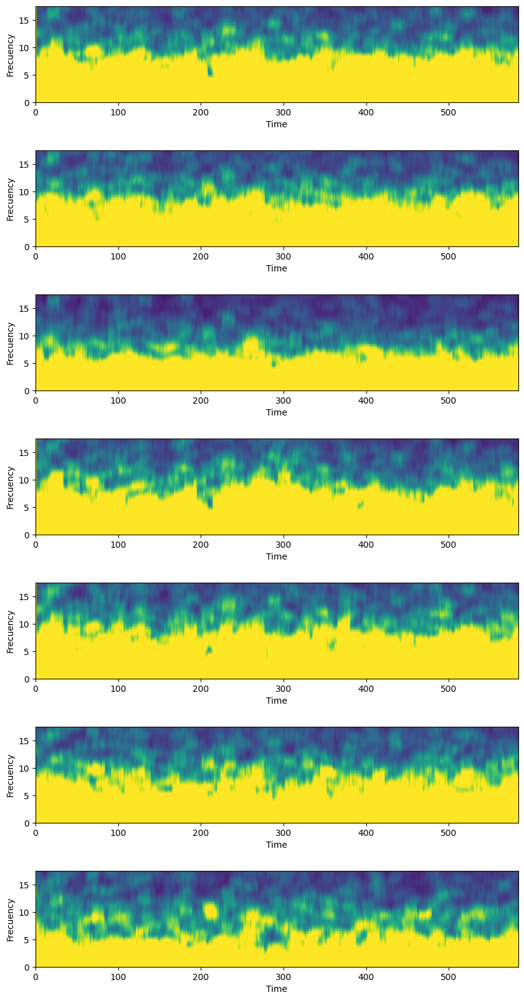

In [17]:
fig,ax = plt.subplots(col,1)
t1=np.arange(0,585)
f1=np.arange(0,18,0.5)
fig.set_size_inches(10,20)
for i in range(col):
    ax[i].pcolormesh(t1, f1, power_focus_ave['eeg_record3'][i,:,:],vmin=0, vmax=2*np.sqrt(2), shading='gouraud')
    ax[i].set_xlabel("Time")
    ax[i].set_ylabel("Frecuency")

plt.subplots_adjust(hspace=0.5)
plt.show()

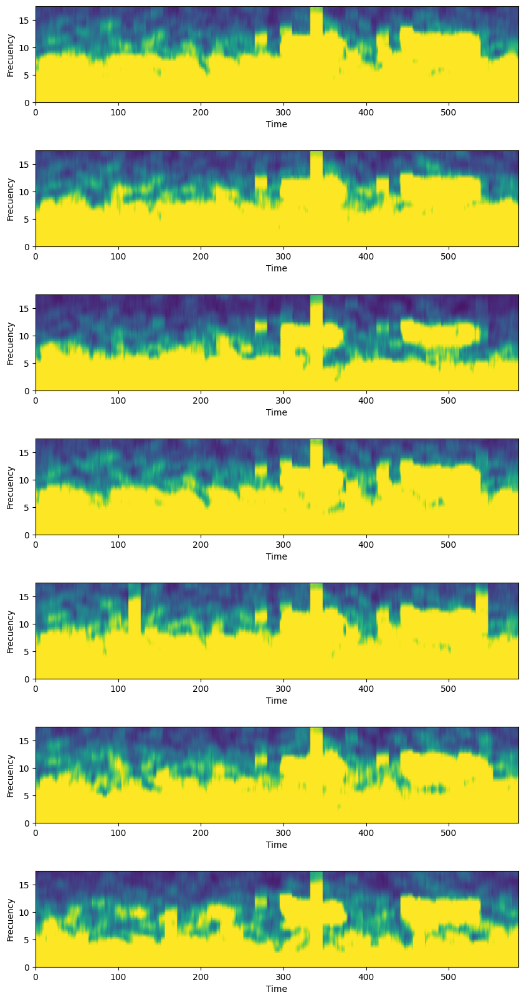

In [18]:
fig,ax = plt.subplots(col,1)
t1=np.arange(0,585)
f1=np.arange(0,18,0.5)
fig.set_size_inches(10,20)
for i in range(col):
    ax[i].pcolormesh(t1, f1, power_unfocus_ave['eeg_record3'][i,:,:],vmin=0, vmax=2*np.sqrt(2), shading='gouraud')
    ax[i].set_xlabel("Time")
    ax[i].set_ylabel("Frecuency")

plt.subplots_adjust(hspace=0.5)
plt.show()

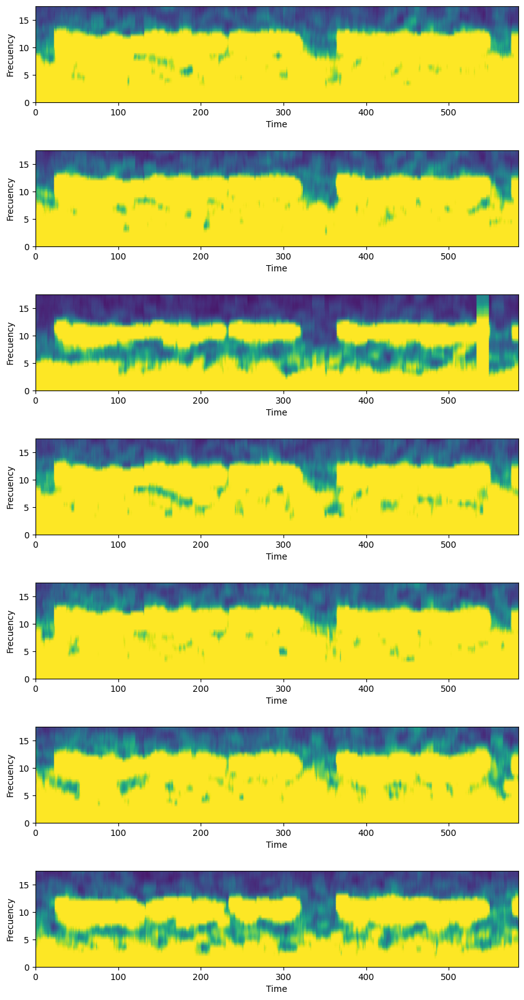

In [19]:
fig,ax = plt.subplots(col,1)
t1=np.arange(0,585)
f1=np.arange(0,18,0.5)
fig.set_size_inches(10,20)
for i in range(col):
    ax[i].pcolormesh(t1, f1, power_drowsy_ave['eeg_record3'][i,:,:],vmin=0, vmax=2*np.sqrt(2), shading='gouraud')
    ax[i].set_xlabel("Time")
    ax[i].set_ylabel("Frecuency")

plt.subplots_adjust(hspace=0.5)
plt.show()

Transforms the averaged power spectral density (PSD) data into a vector format suitable for Support Vector Machine (SVM) classification.

The resulting SVM vectors have dimensions [252, 585], where:

- 252 represents the number of rows, corresponding to the number of trials.
- 585 represents the number of columns, corresponding to the number of time steps.

In [20]:
svm_focus = {}
for name in trail_names:
    svm_focus[name]=np.zeros([252,585])
    
svm_unfocus = {}
for name in trail_names:
    svm_unfocus[name]=np.zeros([252,585])
    
svm_drowsy = {}
for name in trail_names:
    svm_drowsy[name]=np.zeros([252,585])

for name in trail_names:
    for j in range(585):      
        svm_focus[name][:,j]=power_focus_ave[name][:,:,j].reshape(1,-1)
        svm_unfocus[name][:,j]=power_unfocus_ave[name][:,:,j].reshape(1,-1)
        svm_drowsy[name][:,j]=power_drowsy_ave[name][:,:,j].reshape(1,-1)
    svm_focus[name]=10*np.log(svm_focus[name])
    svm_unfocus[name]=10*np.log(svm_unfocus[name])
    svm_drowsy[name]=10*np.log(svm_drowsy[name])

svm_focus['eeg_record33'].shape

(252, 585)

Visualize how the power values for specific frequencies change over time for each EEG channel. Each one of the 7 channels has 36 rows of data, corresponding to 36 frecuency values (we divided each channel in frequency values ranging from 0.5 to 18 Hz in 0.5 Hz increments)

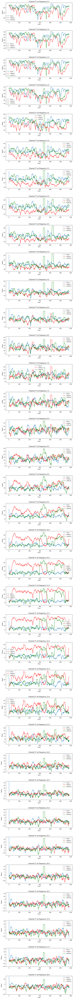

In [21]:
fig,ax = plt.subplots(36,1)
fig.set_size_inches(10,150)

for i in range(36):
    ax[i].plot(svm_focus['eeg_record3'][i,:],label='focus')
    ax[i].plot(svm_drowsy['eeg_record3'][i,:],c='r',label='drowsy')
    ax[i].plot(svm_unfocus['eeg_record3'][i,:],c='green',label='unfocus')
    ax[i].legend()
    ax[i].set_xlabel("Time")
    ax[i].set_ylabel("Power")
    ax[i].set_title("Channel F7 at Frequency "+ str((i+1)*0.5) )

# Adjust spacing (hspace controls vertical spacing)
plt.subplots_adjust(hspace=0.5)  # Increase value to add more margin
plt.show()

Prepare the target labels and subject data for classification.

Three lists (label_focus, label_unfocus, label_drowsy) are created, each containing 585 elements initialized with 0, 1, and 2, respectively. These labels represent the mental states: focused, unfocused, and drowsy.

The target list is populated by concatenating the label lists for each mental state (label_focus, label_unfocus, label_drowsy).

The final shape of 'subj' is (40365, 252), indicating 40365 samples with 252 features each. This implies that there are 40365 instances in the dataset, each represented by 252 features derived from the EEG data.

In [22]:
#--------0
label_focus = [0]*585
#--------1
label_unfocus = [1]*585
#--------2
label_drowsy = [2]*585

target=[]
subj=np.array([]).reshape(252,0).copy()
for name in trail_names:
    subj=np.concatenate((subj,svm_focus[name]), axis=1)
    subj=np.concatenate((subj,svm_unfocus[name]), axis=1)
    subj=np.concatenate((subj,svm_drowsy[name]), axis=1)  
    target = target+label_focus+label_unfocus+label_drowsy
subj=subj.T
target = np.array(target)

subj.shape

(40365, 252)

Divide the data into training and testing

In [23]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing

data_train, data_test, data_train_target, data_test_target = train_test_split(subj, target, test_size=0.2, random_state=0)

scaler = preprocessing.StandardScaler().fit(data_train)

X_train_scaled = scaler.transform(data_train)
X_test_scaled = scaler.transform(data_test)

k-NN Classifier

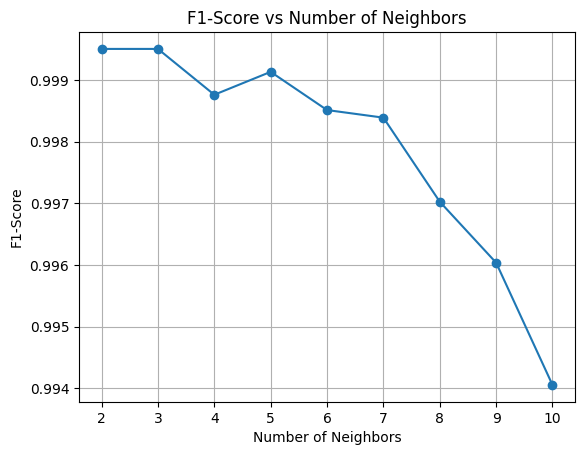

Best result:
Number of Neighbors: 3
Classification Report:
              precision    recall  f1-score      support
0              0.999626  0.999626  0.999626  2677.000000
1              0.998868  0.999622  0.999245  2648.000000
2              1.000000  0.999272  0.999636  2748.000000
accuracy       0.999505  0.999505  0.999505     0.999505
macro avg      0.999498  0.999507  0.999502  8073.000000
weighted avg   0.999505  0.999505  0.999505  8073.000000


In [24]:
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
import pandas as pd

neighbors = range(2, 11)
best_f1 = 0
best_neighbors = 0
classification_reports = {}

for n in neighbors:
    knn_classifier = KNeighborsClassifier(n_neighbors=n)
    
    # Train the classifier on the scaled training data
    knn_classifier.fit(X_train_scaled, data_train_target)

    # Predict labels for the test set
    predicted_labels = knn_classifier.predict(X_test_scaled)

    # Compute classification report
    report = classification_report(data_test_target, predicted_labels, output_dict=True)
    
    # Store the classification report for the current number of neighbors
    classification_reports[n] = report
    
    # Update best metrics if current accuracy is higher
    if report['weighted avg']['f1-score'] > best_f1:
        best_f1 = report['weighted avg']['f1-score']
        best_neighbors = n

# Plot the accuracy for different numbers of neighbors
plt.plot(neighbors, [classification_reports[n]['weighted avg']['f1-score'] for n in neighbors], marker='o')
plt.xlabel('Number of Neighbors')
plt.ylabel('F1-Score')
plt.title('F1-Score vs Number of Neighbors')
plt.xticks(neighbors)
plt.grid(True)
plt.show()

# Print the classification report for the best result
print("Best result:")
print(f"Number of Neighbors: {best_neighbors}")
print("Classification Report:")
report_df = pd.DataFrame(classification_reports[best_neighbors]).transpose()
print(report_df)